Denoise

# unzip


### Drive

In [2]:
!unzip --help

UnZip 6.00 of 20 April 2009, by Debian. Original by Info-ZIP.

Usage: unzip [-Z] [-opts[modifiers]] file[.zip] [list] [-x xlist] [-d exdir]
  Default action is to extract files in list, except those in xlist, to exdir;
  file[.zip] may be a wildcard.  -Z => ZipInfo mode ("unzip -Z" for usage).

  -p  extract files to pipe, no messages     -l  list files (short format)
  -f  freshen existing files, create none    -t  test compressed archive data
  -u  update files, create if necessary      -z  display archive comment only
  -v  list verbosely/show version info       -T  timestamp archive to latest
  -x  exclude files that follow (in xlist)   -d  extract files into exdir
modifiers:
  -n  never overwrite existing files         -q  quiet mode (-qq => quieter)
  -o  overwrite files WITHOUT prompting      -a  auto-convert any text files
  -j  junk paths (do not make directories)   -aa treat ALL files as text
  -U  use escapes for all non-ASCII Unicode  -UU ignore any Unicode fields
  -C  mat

In [3]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
!mkdir --help

Usage: mkdir [OPTION]... DIRECTORY...
Create the DIRECTORY(ies), if they do not already exist.

Mandatory arguments to long options are mandatory for short options too.
  -m, --mode=MODE   set file mode (as in chmod), not a=rwx - umask
  -p, --parents     no error if existing, make parent directories as needed
  -v, --verbose     print a message for each created directory
  -Z                   set SELinux security context of each created directory
                         to the default type
      --context[=CTX]  like -Z, or if CTX is specified then set the SELinux
                         or SMACK security context to CTX
      --help     display this help and exit
      --version  output version information and exit

GNU coreutils online help: <https://www.gnu.org/software/coreutils/>
Report any translation bugs to <https://translationproject.org/team/>
Full documentation <https://www.gnu.org/software/coreutils/mkdir>
or available locally via: info '(coreutils) mkdir invocation'


In [3]:
!mkdir -p dataset/model_ckpt

### S2TLD

In [5]:
!mkdir S2TLD

In [5]:
!unzip "S2TLD（1080x1920）.zip" -d dataset/S2TLD

Archive:  S2TLD（1080x1920）.zip
   creating: dataset/S2TLD/S2TLD（1080x1920）/
   creating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_03.690871079.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_03.941895292.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_04.156560834.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_04.373849590.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_04.589430508.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_04.803536736.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_05.019293528.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_12.876922615.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1920）/Annotations/2020-03-30 11_30_13.092546973.xml  
  inflating: dataset/S2TLD/S2TLD（1080x1

### DND

In [ ]:
!unzip "/content/drive/MyDrive/equipe projeto 1/TAVC/dnd_submission.zip" -d /content/load


In [ ]:
!unzip "/content/drive/MyDrive/equipe projeto 1/TAVC/dnd_2017.zip" -d /content/dataset

In [ ]:
!tar -xzvf "/content/drive/MyDrive/equipe projeto 1/TAVC/unprocessing_models.tar.gz" -C "/content/dataset/model_ckpt/"

tar: /content/dataset/model_ckpt: Cannot open: No such file or directory
tar: Error is not recoverable: exiting now


# importing libs

In [ ]:
# from load.dnd_submission.py import *
import numpy as np
import h5py
from google.colab.patches import cv2_imshow
import cv2
import os

In [8]:
import io
from PIL import Image
from PIL import ImageCms

def convert_to_srgb(img):
    '''Convert PIL image to sRGB color space (if possible)'''
    # icc = img.info.get('icc_profile', '') if img.info and img.info.get('icc_profile', '') else ''
    icc = ''
    if icc:
        io_handle = io.BytesIO(icc)     # virtual file
        src_profile = ImageCms.ImageCmsProfile(io_handle)
        dst_profile = ImageCms.createProfile('sRGB')
        img = ImageCms.profileToProfile(img, src_profile, dst_profile)
    return img

In [9]:
# from PIL import Image
# path = 'seumadruga2.jpg'
# icc = Image.open(path).info.get('icc_profile') 
# print(icc)

In [10]:
# import h5py
# pixelmasks = h5py.File("/content/dataset/pixelmasks.mat", 'r')
# print(np.array(pixelmasks["pixelmasks"]["sigma_srgb"]))
# dict(pixelmasks)

# load dataset

### load dataset 1

In [11]:
from scipy.io import loadmat

def inteiro(valor):
  if len(valor.shape) > 1:
    # print(valor)
    # result = np.apply_over_axes(inteiro, valor, 0)
    # print(result)
    return np.apply_along_axis(inteiro, 0, valor)

  return np.array([value*255 for value in valor], dtype=np.int16)

def carrega_imagem(filename, number ):
  # , dtype= info["info"]["camera"][0][number]
  print(filename)
  # print([data for key, _ in dict(data).keys()])
  img = h5py.File(filename, 'r')
  # print(img["InoisySRGB"])
  print(img)
  scale = np.array(img['InoisySRGB']).T
  # InoisySRGB = np.int16(scale*255)
  InoisySRGB = np.array(scale*255, dtype=np.uint8)
  # print(img["InoisySRGB"])
  print(InoisySRGB.shape)
  # InoisySRGB = np.int16(scale*255)
  InoisySRGB = np.array(scale*255, dtype=np.uint8)
  return InoisySRGB

def show_image(filename, number):
  InoisySRGB = carrega_imagem(filename, number)
  # InoisySRGB = loadmat(filename)['InoisySRGB']

  # print(InoisySRGB)

  resized = cv2.resize(InoisySRGB, (300, 300), interpolation = cv2.INTER_AREA)
  resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
  # resized    
  # print(InoisySRGB.shape)
  cv2_imshow(resized)
  # cv2_imshow(InoisySRGB[1000:3000,1000:3000])



## base

In [ ]:
info = h5py.File("/content/dataset/info.mat", "r")
print(info["info"]["camera"][0][0])
dict(info["info"])
# dict(info[info["info"]["camera"][0][0]])

<HDF5 object reference>


{'boundingboxes': <HDF5 dataset "boundingboxes": shape (1, 50), type "|O">,
 'camera': <HDF5 dataset "camera": shape (1, 50), type "|O">,
 'nlf': <HDF5 dataset "nlf": shape (1, 50), type "|O">,
 'sigma_raw': <HDF5 dataset "sigma_raw": shape (1, 50), type "|O">,
 'sigma_srgb': <HDF5 dataset "sigma_srgb": shape (1, 50), type "|O">}

In [ ]:
import scipy.io as sio
def denoise_raw(denoiser, data_dir, output_dir):
  """Denoises all bounding boxes in all raw images from the DND dataset.
  The resulting denoised images are saved to disk.
  Args:
    denoiser: Function handle called as:
        denoised_img = denoiser(noisy_img, shot_noise, read_noise).
    data_dir: Folder where the DND dataset resides
    output_dir: Folder where denoised output should be written to
  Returns:
    None
  """
  # Loads image information and bounding boxes.
  info = h5py.File(os.path.join(data_dir, 'info.mat'), 'r')['info']
  bb = info['boundingboxes']

  # Denoise each image.
  for i in range(50):
    # Loads the noisy image.
    filename = os.path.join(data_dir, 'images_raw', '%04d.mat' % (i + 1))
    img = h5py.File(filename, 'r')
    noisy = np.float32(np.array(img['Inoisy']).T)

    # Loads raw Bayer color pattern.
    bayer_pattern = np.asarray(info[info['camera'][0][i]]['pattern']).tolist()

    # Denoises each bounding box in this image.
    boxes = np.array(info[bb[0][i]]).T
    for k in range(20):
      # Crops the image to this bounding box.
      idx = [
          int(boxes[k, 0] - 1),
          int(boxes[k, 2]),
          int(boxes[k, 1] - 1),
          int(boxes[k, 3])
      ]
      print()
      noisy_crop = noisy[idx[0]:idx[1], idx[2]:idx[3]].copy()

      # Flips the raw image to ensure RGGB Bayer color pattern.
      if (bayer_pattern == [[1, 2], [2, 3]]):
        pass
      elif (bayer_pattern == [[2, 1], [3, 2]]):
        noisy_crop = np.fliplr(noisy_crop)
      elif (bayer_pattern == [[2, 3], [1, 2]]):
        noisy_crop = np.flipud(noisy_crop)
      else:
        print('Warning: assuming unknown Bayer pattern is RGGB.')

      # Loads shot and read noise factors.
      nlf_h5 = info[info['nlf'][0][i]]
      shot_noise = nlf_h5['a'][0][0]
      read_noise = nlf_h5['b'][0][0]

      # Extracts each Bayer image plane.
      denoised_crop = noisy_crop.copy()
      height, width = noisy_crop.shape
      channels = []
      for yy in range(2):
        for xx in range(2):
          noisy_crop_c = noisy_crop[yy:height:2, xx:width:2].copy()
          channels.append(noisy_crop_c)
      channels = np.stack(channels, axis=-1)
      cv2_imshow(channels[:,:,1:])
      # print(channels)
      # print(channels.shape)
      exit()

      # Denoises this crop of the image.
      output = denoiser(channels, shot_noise, read_noise)

      # Copies denoised results to output denoised array.
      for yy in range(2):
        for xx in range(2):
          denoised_crop[yy:height:2, xx:width:2] = output[:, :, 2 * yy + xx]

      # Flips denoised image back to original Bayer color pattern.
      if (bayer_pattern == [[1, 2], [2, 3]]):
        pass
      elif (bayer_pattern == [[2, 1], [3, 2]]):
        denoised_crop = np.fliplr(denoised_crop)
      elif (bayer_pattern == [[2, 3], [1, 2]]):
        denoised_crop = np.flipud(denoised_crop)

      # Saves denoised image crop.
      denoised_crop = np.clip(np.float32(denoised_crop), 0.0, 1.0)
      save_file = os.path.join(output_dir, '%04d_%02d.mat' % (i + 1, k + 1))
      sio.savemat(save_file, {'denoised_crop': denoised_crop})

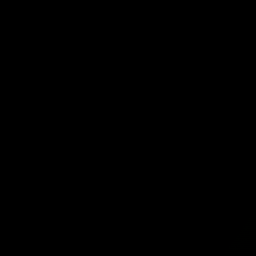

TypeError: ignored

In [ ]:
# denoise_raw(lambda x: x, "/content/dataset/", "/content/dataset/images_noise/")

## unprocessing

In [ ]:
!git clone https://github.com/timothybrooks/unprocessing

Cloning into 'unprocessing'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 17 (delta 0), reused 0 (delta 0), pack-reused 14
Unpacking objects: 100% (17/17), done.


In [ ]:
!cd unprocessing && ls . && python dnd_denoise.py --model_ckpt=/content/dataset/model_ckpt/models/unprocessing_srgb_loss/model.ckpt-3516383 --data_dir=/content/dataset --output_dir=/content/output_dir

dataset.py	estimator.py  process.py  requirements.txt  unprocess.py
dnd_denoise.py	network.py    README.md   train.py
Traceback (most recent call last):
  File "dnd_denoise.py", line 204, in <module>
    app.run(main)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 308, in run
    _run_main(main, args)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 254, in _run_main
    sys.exit(main(argv))
  File "dnd_denoise.py", line 183, in main
    with tf.Session(graph=graph) as sess:
AttributeError: module 'tensorflow' has no attribute 'Session'


## UnprocessDenoising_PyTorch

In [ ]:
!git clone https://github.com/aasharma90/UnprocessDenoising_PyTorch

Cloning into 'UnprocessDenoising_PyTorch'...
remote: Enumerating objects: 125, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 125 (delta 8), reused 0 (delta 0), pack-reused 106
Receiving objects: 100% (125/125), 5.96 MiB | 20.76 MiB/s, done.
Resolving deltas: 100% (46/46), done.


In [ ]:
!cd UnprocessDenoising_PyTorch && ls . && python dnd_denoise.py --load_model=/content/dataset/model_ckpt/models/unprocessing_srgb_loss/model.ckpt-3516383.data-00000-of-00001 --data_dir=/content/dataset --results_dir=/content/output_dir

dataloader  dnd_denoise.py  images  metrics.py	models	README.md  train.py
Loading pre-trained checkpoint /content/dataset/model_ckpt/models/unprocessing_srgb_loss/model.ckpt-3516383.data-00000-of-00001
Traceback (most recent call last):
  File "dnd_denoise.py", line 65, in <module>
    model_psnr = torch.load(args.load_model)['avg_psnr']
  File "/usr/local/lib/python3.7/dist-packages/torch/serialization.py", line 699, in load
    with _open_file_like(f, 'rb') as opened_file:
  File "/usr/local/lib/python3.7/dist-packages/torch/serialization.py", line 230, in _open_file_like
    return _open_file(name_or_buffer, mode)
  File "/usr/local/lib/python3.7/dist-packages/torch/serialization.py", line 211, in __init__
    super(_open_file, self).__init__(open(name, mode))
FileNotFoundError: [Errno 2] No such file or directory: '/content/dataset/model_ckpt/models/unprocessing_srgb_loss/model.ckpt-3516383.data-00000-of-00001'


# Testando

/content/dataset/images_raw/0001.mat
<HDF5 file "0001.mat" (mode r)>
(500, 500, 3)


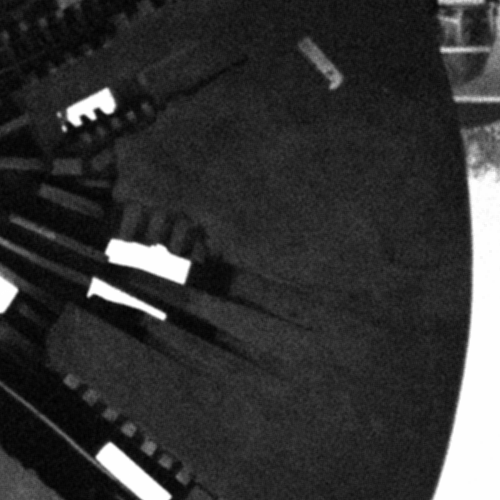

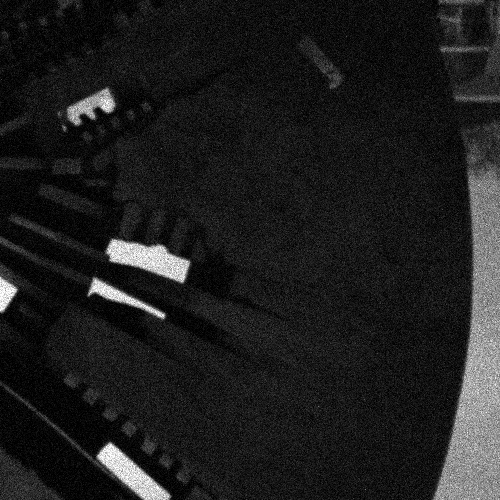

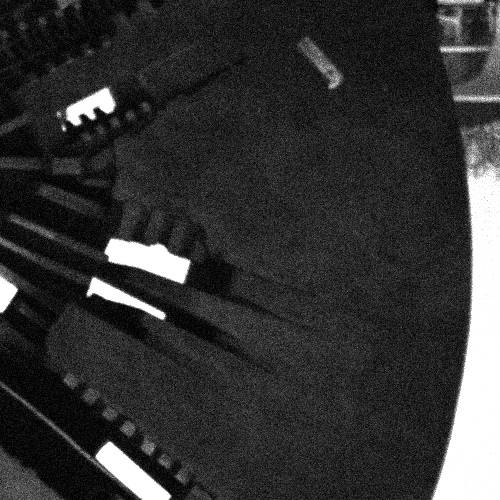

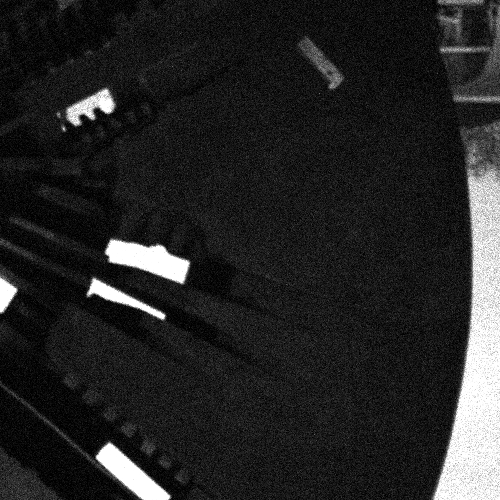

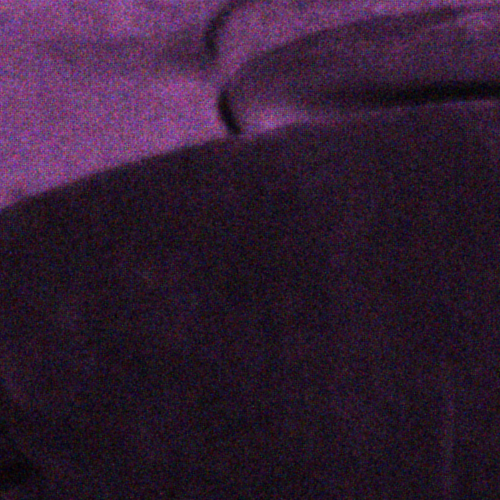

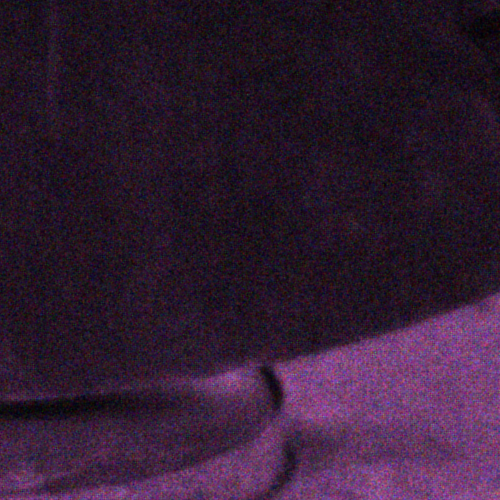

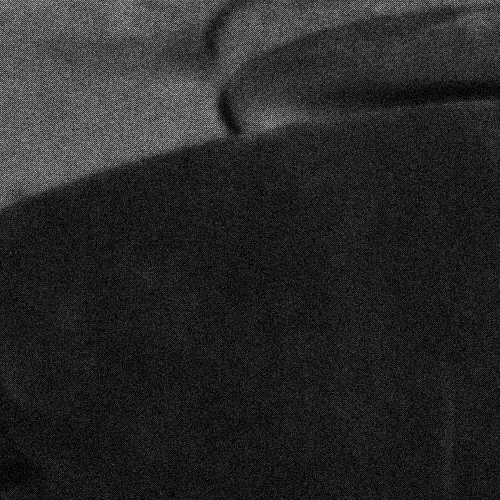

In [ ]:
# from unprocessing.dataset import *
import numpy as np
import imageio
import sys
import os


def extract_bayer_channels(raw):

    ch_B  = raw[1::2, 1::2]
    ch_Gb = raw[0::2, 1::2]
    ch_R  = raw[0::2, 0::2]
    ch_Gr = raw[1::2, 0::2]

    return ch_R, ch_Gr, ch_B, ch_Gb

def carrega_imagem_raw(filename):
  # , dtype= info["info"]["camera"][0][number]
  print(filename)
  # print([data for key, _ in dict(data).keys()])
  img = h5py.File(filename, 'r')
  # print(img["InoisySRGB"])
  print(img)
  scale = np.array(img['Inoisy']).T
  # InoisySRGB = np.int16(scale*255)
  Inoisy = np.array(scale)
  return Inoisy

# filename = "/content/output_dir/0001_01.mat"
filename = "/content/dataset/images_raw/0001.mat"
# data = loadmat(filename)
data = carrega_imagem_raw(filename)

raw_image = data.astype(np.float32)
ch_R, ch_Gr, ch_B, ch_Gb = extract_bayer_channels(raw_image)

ch_R = ch_R*255
ch_Gr = ch_Gr*255
ch_B = ch_B*255
ch_Gb = ch_Gb*255
png_image = raw_image*255

ch_R = ch_R.astype(np.uint16)
ch_R = cv2.blur(ch_R, (3,3))
ch_Gr = ch_Gr.astype(np.uint16)
ch_B = ch_B.astype(np.uint16)
ch_Gb = ch_Gb.astype(np.uint16)
png_image = png_image.astype(np.uint16)
J = cv2.cvtColor(png_image, cv2.COLOR_BayerRG2RGB)
print(J[1500:1000:-1,1500:1000:-1, ::-1].shape)

cv2_imshow(ch_R[1000:1500,1000:1500])
cv2_imshow(ch_Gr[1000:1500,1000:1500])
cv2_imshow(ch_B[1000:1500,1000:1500])
cv2_imshow(ch_Gb[1000:1500,1000:1500])
cv2_imshow(J[1000:1500,1000:1500, ::-1])
cv2_imshow(J[1500:1000:-1,1500:1000:-1, ::-1])
cv2_imshow(png_image[1000:1500,1000:1500])

In [ ]:
data_folder = "/content/output_dir"

files = os.listdir(data_folder)[:1]
for i, filename in zip(range(len(files)), files):
    filename = os.path.join(data_folder, filename)

    show_image(filename, i+1)


/content/output_dir/0010_17.mat
(512, 512)


OSError: ignored

/content/dataset/images_srgb/0001.mat
<HDF5 file "0001.mat" (mode r)>
(4028, 3020, 3)


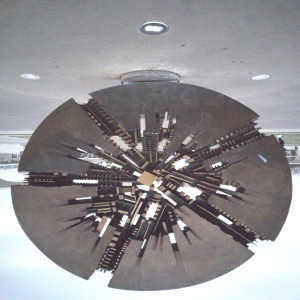

/content/dataset/images_srgb/0002.mat
<HDF5 file "0002.mat" (mode r)>
(4028, 3020, 3)


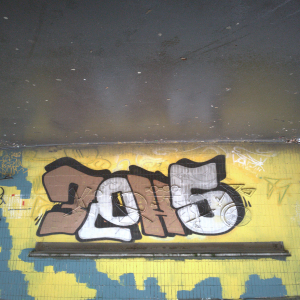

/content/dataset/images_srgb/0003.mat
<HDF5 file "0003.mat" (mode r)>
(4028, 3020, 3)


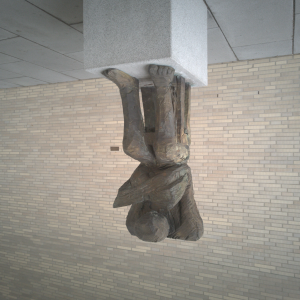

/content/dataset/images_srgb/0004.mat
<HDF5 file "0004.mat" (mode r)>
(4028, 3020, 3)


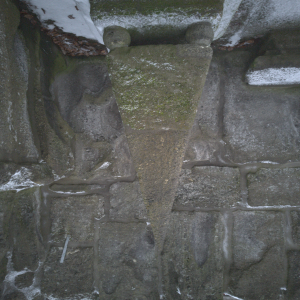

/content/dataset/images_srgb/0005.mat
<HDF5 file "0005.mat" (mode r)>
(4028, 3020, 3)


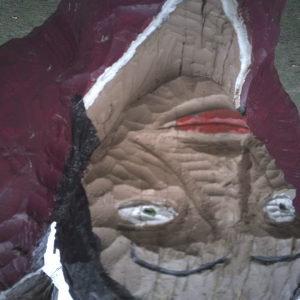

/content/dataset/images_srgb/0006.mat
<HDF5 file "0006.mat" (mode r)>
(4916, 7358, 3)


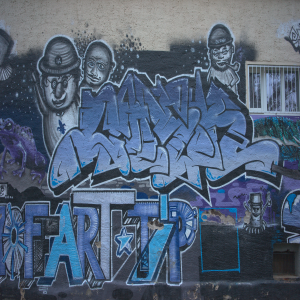

/content/dataset/images_srgb/0007.mat
<HDF5 file "0007.mat" (mode r)>
(4916, 7358, 3)


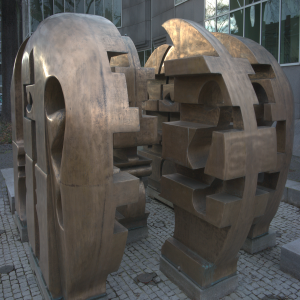

/content/dataset/images_srgb/0008.mat
<HDF5 file "0008.mat" (mode r)>
(4916, 7358, 3)


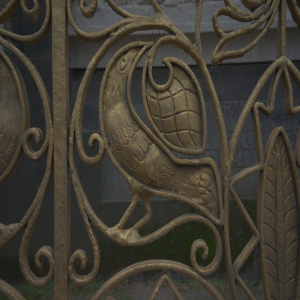

/content/dataset/images_srgb/0009.mat
<HDF5 file "0009.mat" (mode r)>
(4916, 7358, 3)


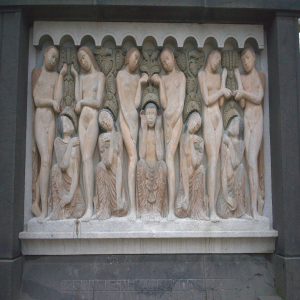

/content/dataset/images_srgb/0010.mat
<HDF5 file "0010.mat" (mode r)>
(4916, 7358, 3)


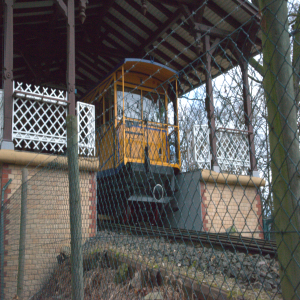

/content/dataset/images_srgb/0011.mat
<HDF5 file "0011.mat" (mode r)>
(4916, 7358, 3)


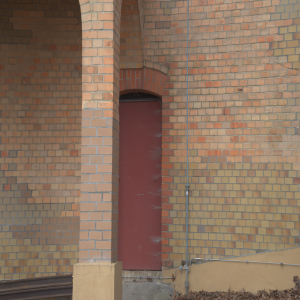

/content/dataset/images_srgb/0012.mat
<HDF5 file "0012.mat" (mode r)>
(4912, 7354, 3)


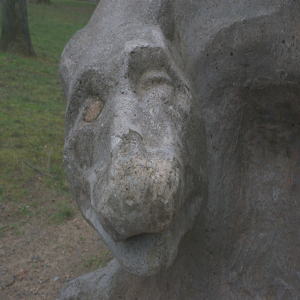

/content/dataset/images_srgb/0013.mat
<HDF5 file "0013.mat" (mode r)>
(4028, 3020, 3)


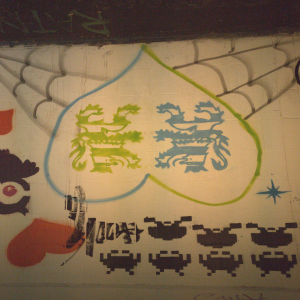

/content/dataset/images_srgb/0014.mat
<HDF5 file "0014.mat" (mode r)>
(4916, 7358, 3)


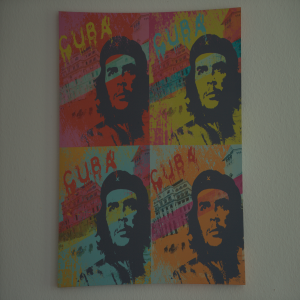

/content/dataset/images_srgb/0015.mat
<HDF5 file "0015.mat" (mode r)>
(4916, 7358, 3)


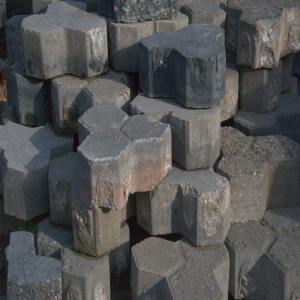

/content/dataset/images_srgb/0016.mat
<HDF5 file "0016.mat" (mode r)>
(4916, 7358, 3)


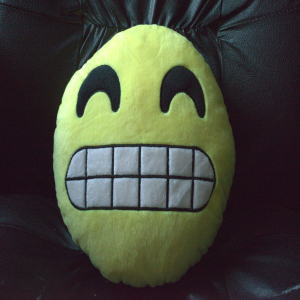

/content/dataset/images_srgb/0017.mat
<HDF5 file "0017.mat" (mode r)>
(3468, 4636, 3)


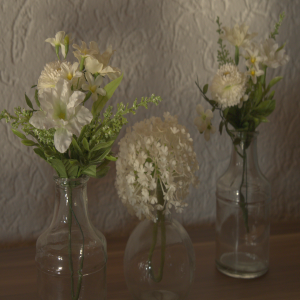

/content/dataset/images_srgb/0018.mat
<HDF5 file "0018.mat" (mode r)>
(4636, 3468, 3)


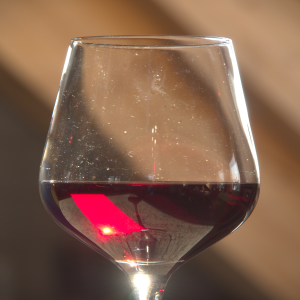

/content/dataset/images_srgb/0019.mat
<HDF5 file "0019.mat" (mode r)>
(3468, 4636, 3)


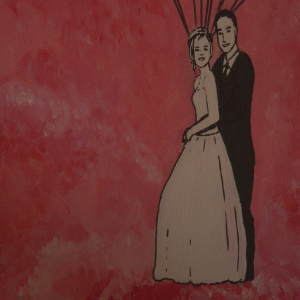

/content/dataset/images_srgb/0020.mat
<HDF5 file "0020.mat" (mode r)>
(3468, 4636, 3)


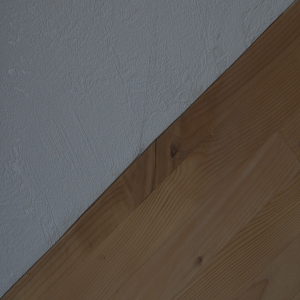

/content/dataset/images_srgb/0021.mat
<HDF5 file "0021.mat" (mode r)>
(3468, 4636, 3)


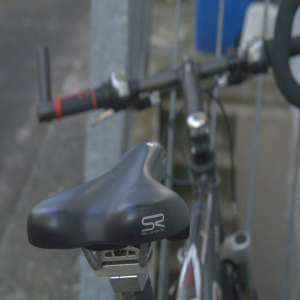

/content/dataset/images_srgb/0022.mat
<HDF5 file "0022.mat" (mode r)>
(3468, 4636, 3)


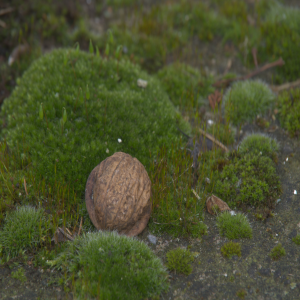

/content/dataset/images_srgb/0023.mat
<HDF5 file "0023.mat" (mode r)>
(3468, 4636, 3)


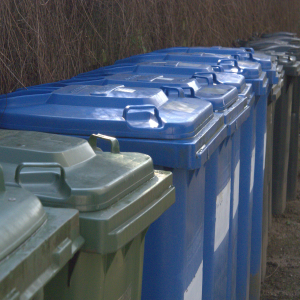

/content/dataset/images_srgb/0024.mat
<HDF5 file "0024.mat" (mode r)>
(3468, 4636, 3)


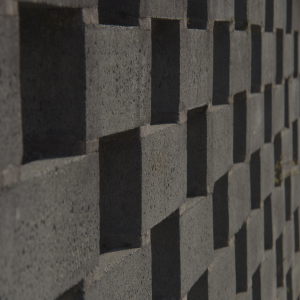

/content/dataset/images_srgb/0025.mat
<HDF5 file "0025.mat" (mode r)>
(3468, 4636, 3)


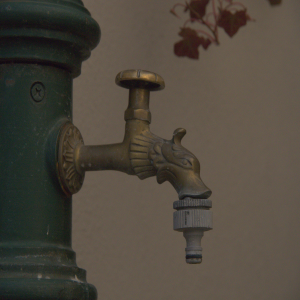

/content/dataset/images_srgb/0026.mat
<HDF5 file "0026.mat" (mode r)>
(3468, 4636, 3)


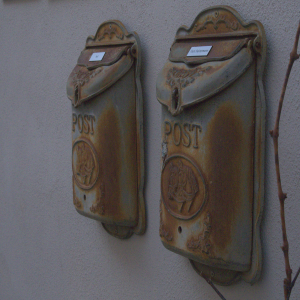

/content/dataset/images_srgb/0027.mat
<HDF5 file "0027.mat" (mode r)>
(3468, 4636, 3)


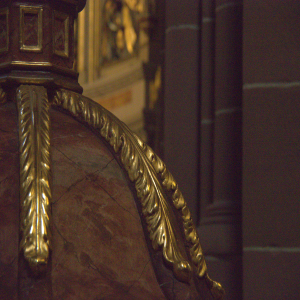

/content/dataset/images_srgb/0028.mat
<HDF5 file "0028.mat" (mode r)>
(3468, 4636, 3)


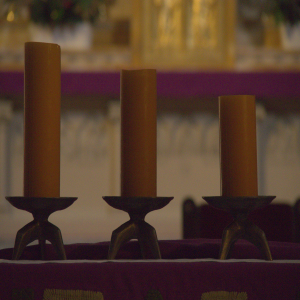

/content/dataset/images_srgb/0029.mat
<HDF5 file "0029.mat" (mode r)>
(3468, 4636, 3)


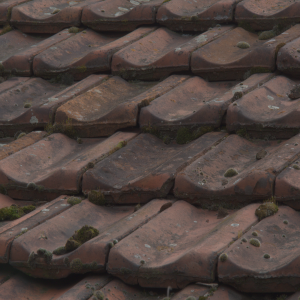

/content/dataset/images_srgb/0030.mat
<HDF5 file "0030.mat" (mode r)>
(3668, 5492, 3)


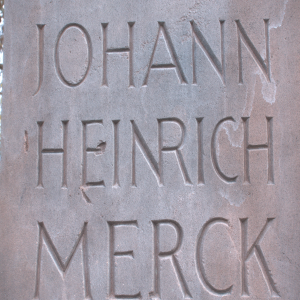

/content/dataset/images_srgb/0031.mat
<HDF5 file "0031.mat" (mode r)>
(3668, 5492, 3)


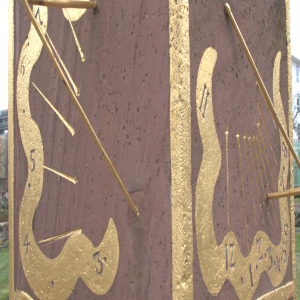

/content/dataset/images_srgb/0032.mat
<HDF5 file "0032.mat" (mode r)>
(3668, 5492, 3)


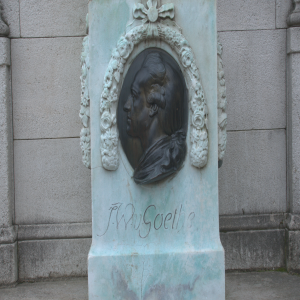

/content/dataset/images_srgb/0033.mat
<HDF5 file "0033.mat" (mode r)>
(5492, 3668, 3)


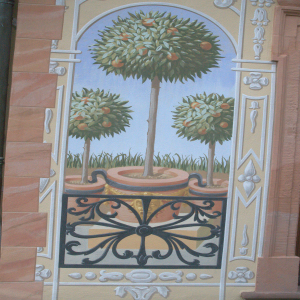

/content/dataset/images_srgb/0034.mat
<HDF5 file "0034.mat" (mode r)>
(3668, 5492, 3)


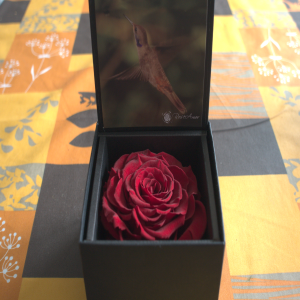

/content/dataset/images_srgb/0035.mat
<HDF5 file "0035.mat" (mode r)>
(3668, 5492, 3)


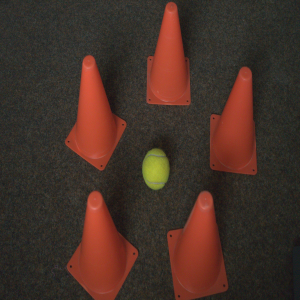

/content/dataset/images_srgb/0036.mat
<HDF5 file "0036.mat" (mode r)>
(3668, 5492, 3)


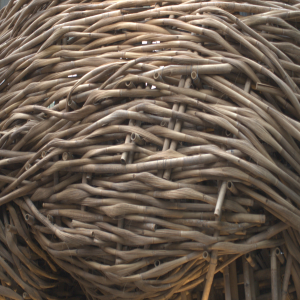

/content/dataset/images_srgb/0037.mat
<HDF5 file "0037.mat" (mode r)>
(3668, 5492, 3)


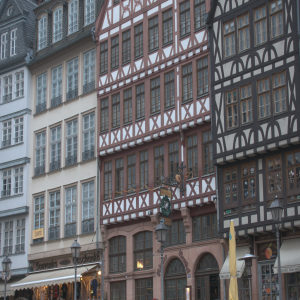

/content/dataset/images_srgb/0038.mat
<HDF5 file "0038.mat" (mode r)>
(5492, 3668, 3)


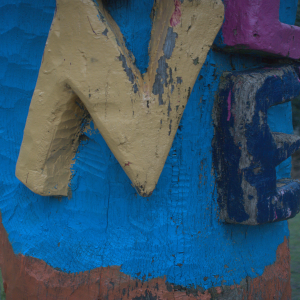

/content/dataset/images_srgb/0039.mat
<HDF5 file "0039.mat" (mode r)>
(3668, 5492, 3)


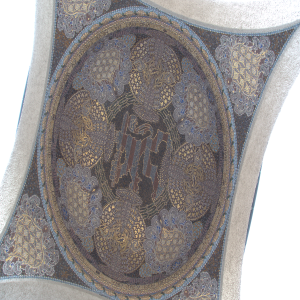

/content/dataset/images_srgb/0040.mat
<HDF5 file "0040.mat" (mode r)>
(3668, 5492, 3)


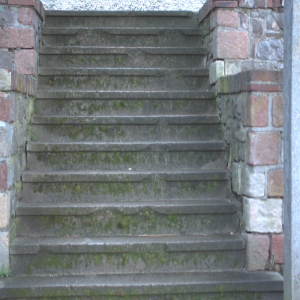

/content/dataset/images_srgb/0041.mat
<HDF5 file "0041.mat" (mode r)>
(3668, 5492, 3)


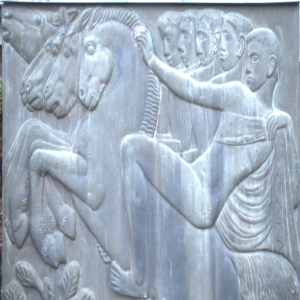

/content/dataset/images_srgb/0042.mat
<HDF5 file "0042.mat" (mode r)>
(4916, 7358, 3)


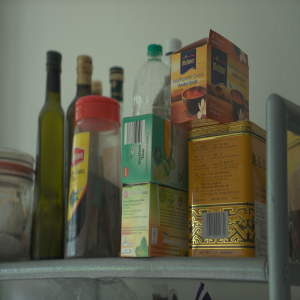

/content/dataset/images_srgb/0043.mat
<HDF5 file "0043.mat" (mode r)>
(4916, 7358, 3)


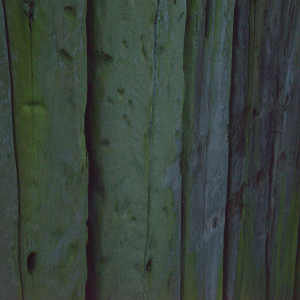

/content/dataset/images_srgb/0044.mat
<HDF5 file "0044.mat" (mode r)>
(4916, 7358, 3)


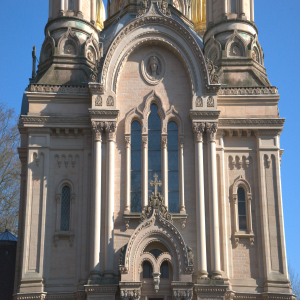

/content/dataset/images_srgb/0045.mat
<HDF5 file "0045.mat" (mode r)>
(4028, 3020, 3)


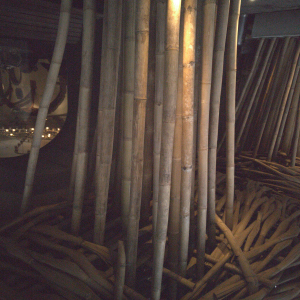

/content/dataset/images_srgb/0046.mat
<HDF5 file "0046.mat" (mode r)>
(4028, 3020, 3)


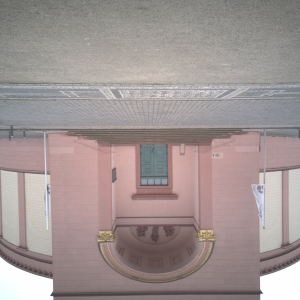

/content/dataset/images_srgb/0047.mat
<HDF5 file "0047.mat" (mode r)>
(4028, 3020, 3)


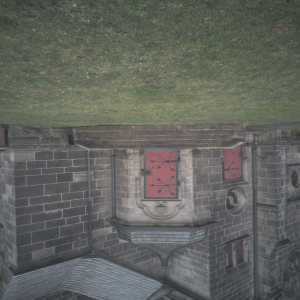

/content/dataset/images_srgb/0048.mat
<HDF5 file "0048.mat" (mode r)>
(4028, 3020, 3)


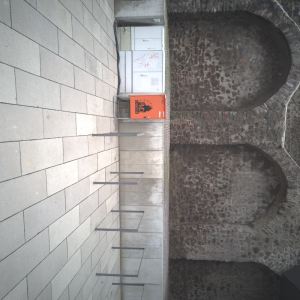

/content/dataset/images_srgb/0049.mat
<HDF5 file "0049.mat" (mode r)>
(4028, 3020, 3)


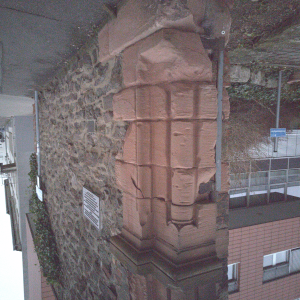

/content/dataset/images_srgb/0050.mat
<HDF5 file "0050.mat" (mode r)>
(4028, 3020, 3)


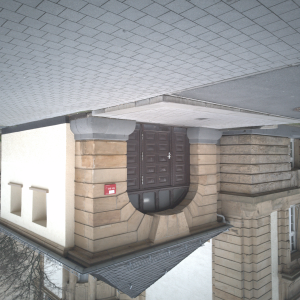

In [ ]:
# bundle_submissions_raw("/content/dataset/images_raw/")
data_folder = "/content/dataset"

# img = h5py.File(filename, 'r')
# print(img["InoisySRGB"])
# InoisySRGB = np.int16((np.array(img['InoisySRGB']).T)*256)
# print(InoisySRGB.shape)
# print(InoisySRGB[1,1])
for i in range(50):
    filename = os.path.join(data_folder, 'images_srgb', '%04d.mat'%(i+1))
    # print(filename)
    show_image(filename, i+1)
    # exit()



In [ ]:
# cv2_imshow(InoisySRGB[:2500,:2500])

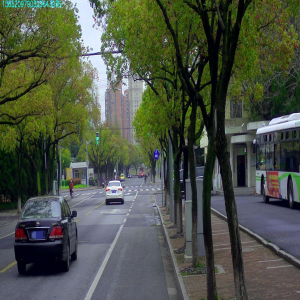

In [12]:
import cv2
img = cv2.imread("/content/S2TLD/S2TLD（1080x1920）/JPEGImages/2020-03-30 11_30_03.690871079.jpg")

resized = cv2.resize(img, (300, 300), interpolation = cv2.INTER_AREA)
cv2_imshow(resized)